In [2]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix,classification_report, accuracy_score
from sklearn import tree
from sklearn.model_selection import cross_val_score
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.metrics.pairwise import cosine_similarity
import plotly.express as px
import scipy.stats as stats

In [3]:
#Read training data file
# Will remove the column name ID As it is not the numerical value which can effect our model
trainfile = r'F:\WP carey SEM 1\aaaa\Quarter 2\ML\assignment 1\Santander Customer Satisfaction - TRAIN.csv'
trainData = pd.read_csv(trainfile)
trainData = trainData.drop("ID", axis=1)

#Read test data file
testfile = r'F:\WP carey SEM 1\aaaa\Quarter 2\ML\assignment 1\Santander Customer Satisfaction - TEST-Without TARGET.csv'
testData = pd.read_csv(testfile)
testData = testData.drop("ID", axis=1)

trainData.head()
print("=======")
testData.head()

,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,imp_op_var40_ult1,...,saldo_medio_var29_ult3,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult1,saldo_medio_var33_ult3,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38
0,2,32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,40532.10
1,2,35,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45486.72
2,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46993.95
3,2,24,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,187898.61
4,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,73649.73


In [71]:
# Now in this step will get the idea about our traindata
trainData.info()
trainData.describe()
trainData.isnull().sum() # Thier is no null values for this dataset
# If their will be some null values for this case we will remove those entries as our dataset is really larrge

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76020 entries, 0 to 76019
Columns: 370 entries, var3 to TARGET
dtypes: float64(111), int64(259)
memory usage: 214.6 MB


var3                       0
var15                      0
imp_ent_var16_ult1         0
imp_op_var39_comer_ult1    0
imp_op_var39_comer_ult3    0
                          ..
saldo_medio_var44_hace3    0
saldo_medio_var44_ult1     0
saldo_medio_var44_ult3     0
var38                      0
TARGET                     0
Length: 370, dtype: int64

In [72]:
# In this step let's drop those entries which are similar to each other, to reduce the redundency
trainData = trainData.drop_duplicates()

In [73]:
trainData.shape
Y_target = trainData['TARGET']

In [111]:
fig = px.histogram(data_frame=trainData, x='TARGET')
fig.show()

From the above histogram of the targeted column we can say that give dataset of the customer satisfaction is imbalance as tthis dataset has more volumn of the customer who are dissatisfied compare to the satisfied customers.

In [74]:
fig = px.scatter(trainData, x='TARGET', y='var3')
fig.show()

In [75]:
fig = px.scatter(trainData, x='var15', y='TARGET')
fig.show()

In [76]:
fig = px.scatter(trainData, x='TARGET', y='var38')
fig.show()

In [117]:
fig = px.box(trainData, x='var3', y='TARGET', orientation='h')
fig.show()

In [119]:
fig = px.box(trainData, x='var15', y='TARGET', orientation='h')
fig.show()

When examining the 'var15' column, we observe a distribution where a substantial proportion of the data points fall within the normal range. This indicates that 'var15' does not have a high number of extreme outliers, contributing to a well-behaved distribution for this particular variable.


In [118]:
fig = px.box(trainData, x='var38', y='TARGET', orientation='h')
fig.show()

Contrary to the distribution of 'var15,' the 'var38' column exhibits a high number of extreme outliers. These outliers warrant further investigation and validation to understand their impact on the dataset and analysis.


In [77]:
#Copy Train data excluding target
trainData_Copy = trainData.iloc[:, :-1].copy()
testData_Copy = testData.iloc[:, :].copy()

trainData_Copy.head()

,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,imp_op_var40_ult1,...,saldo_medio_var29_ult3,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult1,saldo_medio_var33_ult3,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38
0,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39205.170
1,2,34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49278.030
2,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,67333.770
3,2,37,0.0,195.0,195.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,64007.970
4,2,39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117310.979


In [108]:
# Let's Drop those columns as well which has very low varience as they are not really making alot change to our final model
# column_to_drop = column_var[column_var <= varience_threshold].index
# trainData_Copy = trainData_Copy.drop(columns=column_to_drop)
# testData_Copy = testData_Copy.drop(columns=column_to_drop)

In [60]:
trainData_Copy['var3']

0        2
1        2
2        2
3        2
4        2
        ..
76014    2
76015    2
76016    2
76017    2
76018    2
Name: var3, Length: 71213, dtype: int64

In [67]:
# This block of code will find out the 99% confidence interval for all the column
# Our objective is to drop those entries which fall outside this intervals

confidence_level =  0.99999999 #float(input('Enter the desired confidence level: '))
Z_score = stats.norm.ppf((1 + confidence_level) / 2)
# print(Z_score)

def calculate_confidence_interval(df, column, confidence_level=confidence_level):
    column_data = df[column][1:]
    sample_mean = column_data.mean()
    sample_size = len(column_data)
    z_critical = stats.norm.ppf((1 + confidence_level) / 2)
    margin_of_error = z_critical * (column_data.std() / np.sqrt(sample_size))
    confidence_interval = (sample_mean - margin_of_error, sample_mean + margin_of_error)
    return confidence_interval

confidence_interval_dict = {}
for column in trainData_Copy:
    interval = calculate_confidence_interval(trainData_Copy, column)
    confidence_interval_dict[column] = interval

def drop_rows_outside_confidence_interval(dataframe, confidence_intervals):
    filtered_dataframe = dataframe.copy()

    for column in dataframe.columns:
        confidence_interval = confidence_intervals.get(column)
        
        if confidence_interval != (None, None):
            mask = (dataframe[column] >= confidence_interval[0]) & (dataframe[column] <= confidence_interval[1])
            filtered_dataframe = filtered_dataframe[mask]

    return filtered_dataframe

filtered_data = drop_rows_outside_confidence_interval(trainData_Copy, confidence_interval_dict)

C:\Users\hgaje\AppData\Local\Temp\ipykernel_22604\1855996458.py:30: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [68]:
filtered_data

,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,imp_op_var40_ult1,...,saldo_medio_var29_ult3,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult1,saldo_medio_var33_ult3,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38


In [78]:
# Let's drop those column which are similar to each other 
# Set a similarity threshold
similarity_threshold = 0.99  # Example threshold

# Calculate the correlation matrix
correlation_matrix = trainData_Copy.corr()

# Create a list to store the columns to remove
columns_to_remove = []

# Iterate through columns and identify and mark columns to remove
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        correlation = correlation_matrix.iloc[i, j]
        if abs(correlation) >= similarity_threshold:
            columns_to_remove.append(correlation_matrix.columns[i])

# Drop the similar columns
trainData_Copy = trainData_Copy.drop(columns=columns_to_remove)
testData_Copy = testData_Copy.drop(columns=columns_to_remove)

In [79]:
trainData_Copy

,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,imp_op_var40_ult1,...,saldo_medio_var29_ult1,saldo_medio_var29_ult3,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult3,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38
0,2,23,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39205.170
1,2,34,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49278.030
2,2,23,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,67333.770
3,2,37,0.0,195.00,195.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,64007.970
4,2,39,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117310.979
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76014,2,39,0.0,375.99,405.33,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,90214.170
76015,2,48,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,60926.490
76016,2,39,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,118634.520
76017,2,23,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,74028.150


In [80]:
# Using SMOTE to reduce the imbalance
# Split your dataset into X (features) and Y (target)
X_Train = trainData_Copy.iloc[:, :]  # Exclude the last column for features
Y_Train = Y_target # The last column is the target variable

# Check the class distribution before balancing
print("Class distribution before balancing:", Counter(Y_Train))

# Create a SMOTE object (Synthetic Minority Over-sampling Technique)
smote = SMOTE(sampling_strategy='minority', random_state=42)

# Fit and apply SMOTE to the training data
X_Train_resampled, Y_Train_resampled = smote.fit_resample(X_Train, Y_Train)

# Check the class distribution after balancing
print("Class distribution after balancing:", Counter(Y_Train_resampled))

Class distribution before balancing: Counter({0: 68398, 1: 2815})
Class distribution after balancing: Counter({0: 68398, 1: 68398})


In [81]:
# Let's assigned x_train and y_train to create model using this dataset
X_Train = X_Train_resampled
Y_Train = Y_Train_resampled


# Will use this test dataset to test our model on created model using train
X_Test = testData_Copy.iloc[:, :]

In [101]:
# Create Decision Tree Classifier
clf = DecisionTreeClassifier(max_depth=22,  # Change the maximum depth of the tree
    criterion='entropy',  # Change the splitting criterion to entropy
    max_leaf_nodes=78,  # Limit the maximum number of leaf nodes
    min_samples_leaf=250  # Set the minimum samples per leaf
                            )

# Train the decision tree model
clf.fit(X_Train, Y_Train)

# Check accuracy on the training set
X_Pred_train = clf.predict(X_Train)
# Model Accuracy
print("TRAIN Accuracy:", accuracy_score(Y_Train, X_Pred_train))

# Convert continuous predictions to binary using a threshold
Y_Test = clf.predict(X_Test)
# threshold = 
# Y_Test_binary = (Y_Test >= threshold).astype(int)

TRAIN Accuracy: 0.8704859791221966


In [103]:
file_path = r'F:\WP carey SEM 1\aaaa\Quarter 2\ML\assignment 1\result_model_6.csv'
np.savetxt(file_path, Y_Test, delimiter=",")

In [104]:
#Get Class Prediction as a data frame with header as Prediction
pred=pd.DataFrame(clf.predict(X_Train),columns=["Prediction"])

pred.head()

,Prediction
0,0
1,0
2,0
3,0
4,0


In [105]:
#Get Class Prediction probabilities as a data frame 
#Get Prediction Probability for the predicted class as a dataframe
pred_Probability =pd.DataFrame(clf.predict_proba(X_Train))

pred_Probability.head()

,0,1
0,0.801908,0.198092
1,0.656000,0.344000
2,0.990404,0.009596
3,0.769191,0.230809
4,0.956547,0.043453


In [106]:
#Visualize decision tree
text_representation = tree.export_text(clf)
print(text_representation)

|--- feature_37 <= 0.50
|   |--- feature_1 <= 25.50
|   |   |--- feature_125 <= 0.00
|   |   |   |--- feature_280 <= 117691.05
|   |   |   |   |--- feature_280 <= 117271.36
|   |   |   |   |   |--- feature_1 <= 23.50
|   |   |   |   |   |   |--- feature_280 <= 61160.27
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- feature_280 >  61160.27
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_1 >  23.50
|   |   |   |   |   |   |--- feature_280 <= 70157.25
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |--- feature_280 >  70157.25
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |--- feature_280 >  117271.36
|   |   |   |   |   |--- class: 1
|   |   |   |--- feature_280 >  117691.05
|   |   |   |   |--- class: 0
|   |   |--- feature_125 >  0.00
|   |   |   |--- class: 1
|   |--- feature_1 >  25.50
|   |   |--- feature_125 <= 0.00
|   |   |   |--- feature_280 <= 117329.15
|   |   |   |   |--- feature_135 <= 3.50
|   

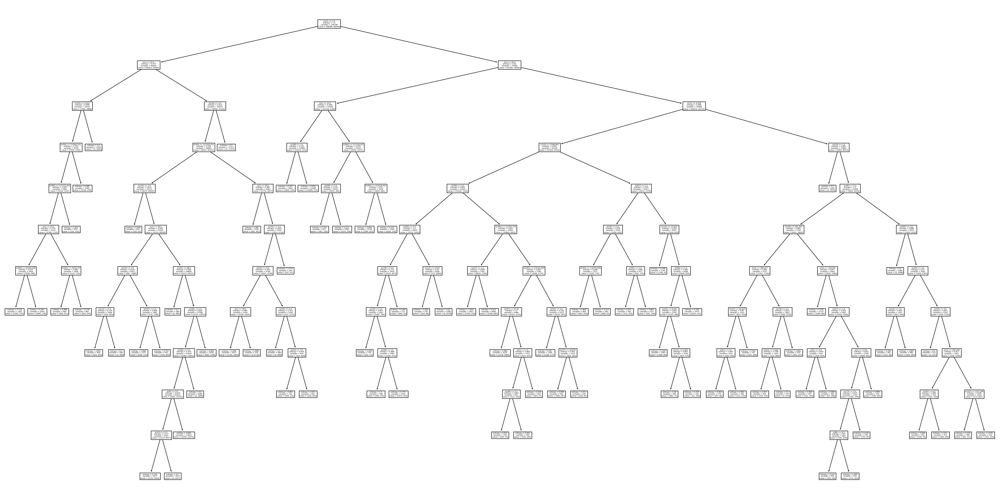

In [107]:
from matplotlib import pyplot as plt

fig = plt.figure(figsize=(40,20))
_ = tree.plot_tree(clf)